<a href="https://colab.research.google.com/github/rhenerose/COVID-2019_Dataset_Visualize/blob/master/SIGNATE_COVID_2019_Dataset_Visualize.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SIGNATE COVID-2019 Dataset Visualize
This Notebook provides visualization of 'SIGNATE COVID-2019 Dataset'.  
referenced:  
https://signate.jp/competitions/261/discussions/20200401171320-59  


#### NOTICE:  
Check this link about 'SIGNATE COVID-2019 Dataset'.  
<https://signate.jp/competitions/261#misc>  
(sorry japanese only)  

On April 8, 'SIGNATE COVID-19 Dataset' format was changed.  
This Notebook is support new format.  

## Install japanese font for matplotlib
at first, run this section and 'RESTART THIS RUNTIME'.


In [1]:
# !sudo apt -y install fonts-noto-cjk
!sudo apt -y install fonts-ipafont-gothic
!rm /root/.cache/matplotlib/fontlist-v310.json

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  fonts-ipafont-mincho
The following NEW packages will be installed:
  fonts-ipafont-gothic fonts-ipafont-mincho
0 upgraded, 2 newly installed, 0 to remove and 25 not upgraded.
Need to get 8,251 kB of archives.
After this operation, 28.7 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fonts-ipafont-gothic all 00303-18ubuntu1 [3,526 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fonts-ipafont-mincho all 00303-18ubuntu1 [4,725 kB]
Fetched 8,251 kB in 1s (6,508 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 2.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
de

### Restart this runtime
please ignore, when you will see the crash log.  
and wait few seconds before run the next cell.


In [0]:
import os
os.kill(os.getpid(), 9)

## Download 'SIGNATE COVID-2019 Dataset'


In [1]:
# download patient data
!wget --no-check-certificate --output-document=covid_19.csv 'https://docs.google.com/spreadsheets/d/10MFfRQTblbOpuvOs_yjIYgntpMGBg592dL8veXoPpp4/export?gid=0&format=csv'
# download location master data
!wget --no-check-certificate --output-document=location.csv 'https://docs.google.com/spreadsheets/d/1NQjppYx0QZQmt6706gCOw9DcIDxgnaEy9QTzfeqeMrQ/export?gid=72903316&format=csv'

--2020-04-10 07:22:27--  https://docs.google.com/spreadsheets/d/10MFfRQTblbOpuvOs_yjIYgntpMGBg592dL8veXoPpp4/export?gid=0&format=csv
Resolving docs.google.com (docs.google.com)... 209.85.145.102, 209.85.145.139, 209.85.145.100, ...
Connecting to docs.google.com (docs.google.com)|209.85.145.102|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘covid_19.csv’

covid_19.csv            [ <=>                ]   2.30M  --.-KB/s    in 0.1s    

2020-04-10 07:22:28 (15.5 MB/s) - ‘covid_19.csv’ saved [2410552]

--2020-04-10 07:22:29--  https://docs.google.com/spreadsheets/d/1NQjppYx0QZQmt6706gCOw9DcIDxgnaEy9QTzfeqeMrQ/export?gid=72903316&format=csv
Resolving docs.google.com (docs.google.com)... 209.85.145.100, 209.85.145.139, 209.85.145.113, ...
Connecting to docs.google.com (docs.google.com)|209.85.145.100|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘location.csv’

location

In [0]:
# !cp '/content/drive/My Drive/dataset/signate/covid-19/SIGNATE COVID-2019 Dataset - 罹患者.csv' covid_19.csv

### Install gspread (not use this time)

In [0]:
# # install gspread
# !pip install --upgrade -q gspread

In [0]:
# from google.colab import auth
# auth.authenticate_user()

# import gspread
# from oauth2client.client import GoogleCredentials

# gc = gspread.authorize(GoogleCredentials.get_application_default())

# workbook = gc.open_by_url('https://docs.google.com/spreadsheets/d/1CnQOf6eN18Kw5Q6ScE_9tFoyddk4FBwFZqZpt_tMOm4/')


In [0]:
# # get '罹患者' worksheet
# ws = workbook.worksheet('罹患者')
# # get_all_values gives a list of rows.
# rows = ws.get_all_values()
# len(rows)

In [0]:
# # show first row (may be data header)
# rows[0]

In [0]:
# # Convert to a DataFrame and render.
# import pandas as pd
# df_origin = pd.DataFrame.from_records(rows[1:])   # data body
# df_origin.columns = rows[0]                       # data header
# df_origin.head()

## Main Code

### Import library

In [0]:
import pandas as pd
import numpy as np
import datetime

In [8]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
import seaborn as sns
# matplotlib use japanese font setting
sns.set(font='IPAPGothic', style='white')
matplotlib.rcParams['font.family'] = 'IPAPGothic'
# matplotlib.rcParams['font.sans-serif'] = ['Hiragino Maru Gothic Pro', 'Yu Gothic', 'Meirio', 'Takao', 'IPAexGothic', 'IPAPGothic', 'VL PGothic', 'Noto Sans CJK JP']
matplotlib.font_manager._rebuild()


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### Set constant variable

In [0]:
pref_area = {
    "北海道":"北海道",
    "青森県":"東北",
    "岩手県":"東北",
    "宮城県":"東北",
    "秋田県":"東北",
    "山形県":"東北",
    "福島県":"東北",
    "茨城県":"北関東・甲信",
    "栃木県":"北関東・甲信",
    "群馬県":"北関東・甲信",
    "埼玉県":"南関東",
    "千葉県":"南関東",
    "東京都":"南関東",
    "神奈川県":"南関東",
    "新潟県":"北陸",
    "富山県":"北陸",
    "石川県":"北陸",
    "福井県":"北陸",
    "山梨県":"北関東・甲信",
    "長野県":"北関東・甲信",
    "岐阜県":"東海",
    "静岡県":"東海",
    "愛知県":"東海",
    "三重県":"東海",
    "滋賀県":"近畿",
    "京都府":"近畿",
    "大阪府":"近畿",
    "兵庫県":"近畿",
    "奈良県":"近畿",
    "和歌山県":"近畿",
    "鳥取県":"中国",
    "島根県":"中国",
    "岡山県":"中国",
    "広島県":"中国",
    "山口県":"中国",
    "徳島県":"四国",
    "香川県":"四国",
    "愛媛県":"四国",
    "高知県":"四国",
    "福岡県":"九州",
    "佐賀県":"九州",
    "長崎県":"九州",
    "熊本県":"九州",
    "大分県":"九州",
    "宮崎県":"九州",
    "鹿児島県":"九州",
    "沖縄県":"九州"
}

colors = {
    "北海道":'#7db0dd',
    "東北":'#8bade0',
    "北陸":'#99a9e2',
    "北関東・甲信":'#a6a6e2',
    "南関東":'#b1a2e1',
    "東海":'#c59cdc',
    "近畿":'#d497d3',
    "中国":'#de94c6',
    "四国":'#e393b6',
    "九州":'#e495a5'
}

### Read 'SIGNATE COVID-2019 Dataset'

In [10]:
df_origin = pd.read_csv('covid_19.csv')
df_origin.head()

,ID,厚労省コード,都道府県症例番号,発症日,確定日,公表日,全国地方公共団体コード,受診都道府県,管理市区町村,居住都道府県,居住市区町村,年代,性別,職業,医療従事者ﾌﾗｸﾞ,ステータス,退院済ﾌﾗｸﾞ,基礎疾患ﾌﾗｸﾞ,症状・経過,症状一覧,行動歴,濃厚接触者状況,濃厚接触場所,海外渡航歴ﾌﾗｸﾞ,ﾀﾞｲﾔﾓﾝﾄﾞﾌﾟﾘﾝｾｽ号乗船ﾌﾗｸﾞ,情報源1,情報源2,備考,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31
0,9,9,0-,2020/01/29,2020/01/30,NaN,NaN,不明,NaN,中華人民共和国,NaN,50 - 59,男性,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_09205.html,NaN,NaN,NaN,0,NaN
1,16,-,0-,NaN,2020/01/31,NaN,NaN,不明,NaN,不明,NaN,30 - 39,男性,NaN,NaN,無症状,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_09273.html,NaN,NaN,NaN,0,NaN
2,17,14,0-,2020/01/31,2020/02/01,NaN,NaN,不明,NaN,不明,NaN,40 - 49,男性,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_09278.html,NaN,NaN,NaN,0,NaN
3,19,-,0-,NaN,2020/02/01,NaN,NaN,不明,NaN,不明,NaN,30 - 39,男性,NaN,NaN,無症状,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_09278.html,NaN,NaN,NaN,0,NaN
4,21,18,0-,2020/01/31,2020/02/04,NaN,NaN,不明,NaN,中華人民共和国,NaN,50 - 59,女性,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_09311.html,NaN,NaN,NaN,0,NaN


In [11]:
df_origin.shape

(5471, 32)

In [12]:
df_origin[df_origin['公表日'].isnull()]

,ID,厚労省コード,都道府県症例番号,発症日,確定日,公表日,全国地方公共団体コード,受診都道府県,管理市区町村,居住都道府県,居住市区町村,年代,性別,職業,医療従事者ﾌﾗｸﾞ,ステータス,退院済ﾌﾗｸﾞ,基礎疾患ﾌﾗｸﾞ,症状・経過,症状一覧,行動歴,濃厚接触者状況,濃厚接触場所,海外渡航歴ﾌﾗｸﾞ,ﾀﾞｲﾔﾓﾝﾄﾞﾌﾟﾘﾝｾｽ号乗船ﾌﾗｸﾞ,情報源1,情報源2,備考,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31
0,9,9,0-,2020/01/29,2020/01/30,NaN,NaN,不明,NaN,中華人民共和国,NaN,50 - 59,男性,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_09205.html,NaN,NaN,NaN,0,NaN
1,16,-,0-,NaN,2020/01/31,NaN,NaN,不明,NaN,不明,NaN,30 - 39,男性,NaN,NaN,無症状,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_09273.html,NaN,NaN,NaN,0,NaN
2,17,14,0-,2020/01/31,2020/02/01,NaN,NaN,不明,NaN,不明,NaN,40 - 49,男性,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_09278.html,NaN,NaN,NaN,0,NaN
3,19,-,0-,NaN,2020/02/01,NaN,NaN,不明,NaN,不明,NaN,30 - 39,男性,NaN,NaN,無症状,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_09278.html,NaN,NaN,NaN,0,NaN
4,21,18,0-,2020/01/31,2020/02/04,NaN,NaN,不明,NaN,中華人民共和国,NaN,50 - 59,女性,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_09311.html,NaN,NaN,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5465,1525,空港検疫28,51-28,NaN,2020/03/27,NaN,NaN,関西国際空港,NaN,兵庫県,NaN,非公表,男性,NaN,NaN,無症状,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_10539.html,NaN,NaN,NaN,51,28.0
5466,2057,空港検疫52,51-52,NaN,2020/03/30,NaN,NaN,関西国際空港,NaN,不明,NaN,30 - 39,男性,NaN,NaN,無症状,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_10638.html,3/29ドイツから帰国,NaN,NaN,51,52.0
5467,2058,空港検疫53,51-53,NaN,2020/03/30,NaN,NaN,関西国際空港,NaN,不明,NaN,40 - 49,男性,NaN,NaN,無症状,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_10638.html,3/29オランダから帰国,NaN,NaN,51,53.0
5468,974,空港検疫9,51-,NaN,2020/03/20,NaN,NaN,関西国際空港,NaN,福岡県,NaN,30 - 39,男性,NaN,NaN,無症状,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_10352.html,3/11イタリア(ピエモンテ州)から帰国/関西空港検疫所,NaN,NaN,51,NaN


In [13]:
# choose use columns
df = df_origin.loc[:, ['公表日', '受診都道府県']]

# remove NaN recode
df.dropna(how='any', inplace=True)

# '公表日' valuse cast to datetime64
df['公表日'] = pd.to_datetime(df['公表日'], format='%Y/%m/%d')
# '受診都道府県' values convet to One-hot-encoding
df = pd.concat([df, pd.get_dummies(df['受診都道府県'])], axis=1)

# set index
df.set_index('公表日', inplace=True)

# remove unused columns
# df.drop(columns=['', '大学職員'], inplace=True)
for col in ['', '大学職員']:
    if col in df.columns:
        df.drop(columns=[''], inplace=True)

df.tail()

,受診都道府県,三重県,京都府,佐賀県,兵庫県,北海道,千葉県,和歌山県,埼玉県,大分県,大阪府,奈良県,宮城県,宮崎県,富山県,山口県,山形県,山梨県,岐阜県,岡山県,広島県,徳島県,愛媛県,愛知県,新潟県,東京都,栃木県,沖縄県,滋賀県,熊本県,石川県,神奈川県,福井県,福岡県,福島県,秋田県,群馬県,茨城県,長崎県,長野県,青森県,静岡県,香川県,高知県,鹿児島県
公表日,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-04-07,沖縄県,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-04-07,沖縄県,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-04-07,沖縄県,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-04-07,沖縄県,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-03-29,東京都,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [14]:
df.shape

(3983, 45)

In [15]:
# summary daily patient count
df_count = df.resample('D').sum().astype(np.int64)
df_count.tail()

,三重県,京都府,佐賀県,兵庫県,北海道,千葉県,和歌山県,埼玉県,大分県,大阪府,奈良県,宮城県,宮崎県,富山県,山口県,山形県,山梨県,岐阜県,岡山県,広島県,徳島県,愛媛県,愛知県,新潟県,東京都,栃木県,沖縄県,滋賀県,熊本県,石川県,神奈川県,福井県,福岡県,福島県,秋田県,群馬県,茨城県,長崎県,長野県,青森県,静岡県,香川県,高知県,鹿児島県
公表日,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-04-05,0,0,2,13,1,8,0,25,0,21,1,3,2,0,0,0,3,0,1,0,0,1,7,0,35,0,0,0,2,0,27,0,16,0,0,0,5,1,1,0,0,0,8,0
2020-04-06,0,0,0,6,0,8,0,10,1,20,0,0,1,0,5,0,5,0,0,1,0,2,11,0,83,0,6,0,0,0,6,0,14,0,0,0,6,0,2,0,0,0,3,0
2020-04-07,0,0,1,20,0,5,0,0,2,53,0,5,1,0,1,0,0,0,1,0,0,0,10,0,80,0,12,0,1,0,18,0,23,0,0,0,0,1,0,0,0,0,2,0
2020-04-08,0,0,2,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,7,0,0,0,0,0,0,0,0,0,1,1,0
2020-04-09,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,10,0


In [16]:
# summary daily patient total count
df_cumsum = df_count.cumsum()
df_cumsum.tail()

,三重県,京都府,佐賀県,兵庫県,北海道,千葉県,和歌山県,埼玉県,大分県,大阪府,奈良県,宮城県,宮崎県,富山県,山口県,山形県,山梨県,岐阜県,岡山県,広島県,徳島県,愛媛県,愛知県,新潟県,東京都,栃木県,沖縄県,滋賀県,熊本県,石川県,神奈川県,福井県,福岡県,福島県,秋田県,群馬県,茨城県,長崎県,長野県,青森県,静岡県,香川県,高知県,鹿児島県
公表日,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-04-05,14,78,8,203,193,152,18,186,32,408,25,23,10,10,7,3,14,47,11,15,3,21,228,31,1032,17,16,17,20,30,263,46,162,14,7,20,57,12,12,11,9,2,34,3
2020-04-06,14,78,8,209,193,160,18,196,33,428,25,23,11,10,12,3,19,47,11,16,3,23,239,31,1115,17,22,17,20,30,269,46,176,14,7,20,63,12,14,11,9,2,37,3
2020-04-07,14,78,9,229,193,165,18,196,35,481,25,28,12,10,13,3,19,47,12,16,3,23,249,31,1195,17,34,17,21,30,287,46,199,14,7,20,63,13,14,11,9,2,39,3
2020-04-08,14,78,11,229,193,165,18,196,41,481,25,28,12,10,13,3,19,47,12,16,3,23,249,31,1195,17,34,17,22,30,287,53,199,14,7,20,63,13,14,11,9,3,40,3
2020-04-09,14,78,11,229,193,165,18,196,41,481,25,28,12,10,13,3,19,47,12,16,3,23,249,31,1195,17,34,17,22,30,287,58,199,14,7,20,63,13,14,11,9,3,50,3


In [17]:
# ex.) get record of '2020-04-01'
df_cumsum[df_cumsum.index == pd.to_datetime(datetime.date(2020, 4, 1))]

,三重県,京都府,佐賀県,兵庫県,北海道,千葉県,和歌山県,埼玉県,大分県,大阪府,奈良県,宮城県,宮崎県,富山県,山口県,山形県,山梨県,岐阜県,岡山県,広島県,徳島県,愛媛県,愛知県,新潟県,東京都,栃木県,沖縄県,滋賀県,熊本県,石川県,神奈川県,福井県,福岡県,福島県,秋田県,群馬県,茨城県,長崎県,長野県,青森県,静岡県,香川県,高知県,鹿児島県
公表日,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-04-01,13,72,3,162,181,124,18,101,29,278,15,11,3,4,5,2,5,31,5,6,3,9,183,31,560,17,9,7,15,14,161,22,78,6,7,20,41,5,8,8,9,2,20,2


In [18]:
# ex.) get series data of '2020-4-1' (TOP10)
df_cumsum[df_cumsum.index == pd.to_datetime(datetime.date(2020, 4, 7))].iloc[0].sort_values(ascending=True)[-10:]

京都府       78
千葉県      165
北海道      193
埼玉県      196
福岡県      199
兵庫県      229
愛知県      249
神奈川県     287
大阪府      481
東京都     1195
Name: 2020-04-07 00:00:00, dtype: int64

### Bar Chart Race Draw Function

In [0]:
# Bar Chart Race Draw Function
def draw_barchart(date, top=10):
    dateData = df_cumsum[df_cumsum.index == pd.to_datetime(date)]

    # check exist record
    if len(dateData) == 0:
        # not exist
        print('no data!!')
        return
    elif len(dateData.columns) < top:
      top = len(dateData.columns)

    # get series data (top N)
    data = dateData.iloc[0].sort_values(ascending=True)[-top:]

    # draw chart
    # fig, ax = plt.subplots(figsize=(15, 8))
    ax.clear()
    ax.barh(data.index, data.values, color=[colors[pref_area[x]] for x in data.index])
    
    # draw series label
    for i, (name, value) in enumerate(zip(data.index, data.values)):
        area = pref_area[name]
        ax.text(value, i, name, size=14, weight=600, ha='right', va='bottom')
        ax.text(value, i-.25, area, size=10, color='#444444', ha='right', va='baseline')
        ax.text(value, i, value, size=14, ha='left',  va='bottom')

    ax.text(1, 0.4, data.name.date(), transform=ax.transAxes,color='#777777', size=38, ha='right', weight=800)
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    plt.box(False)

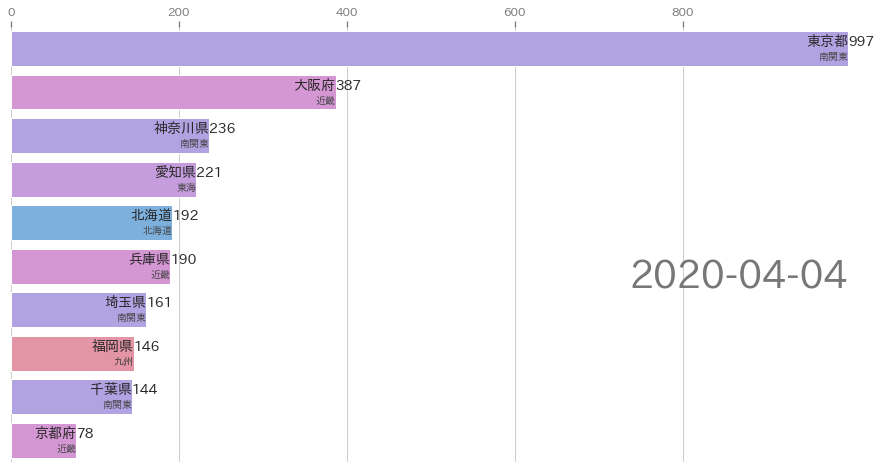

In [20]:
# ex.）total patient at 2020-04-04
fig, ax = plt.subplots(figsize=(15, 8))
draw_barchart(datetime.date(2020, 4, 4), top=10)

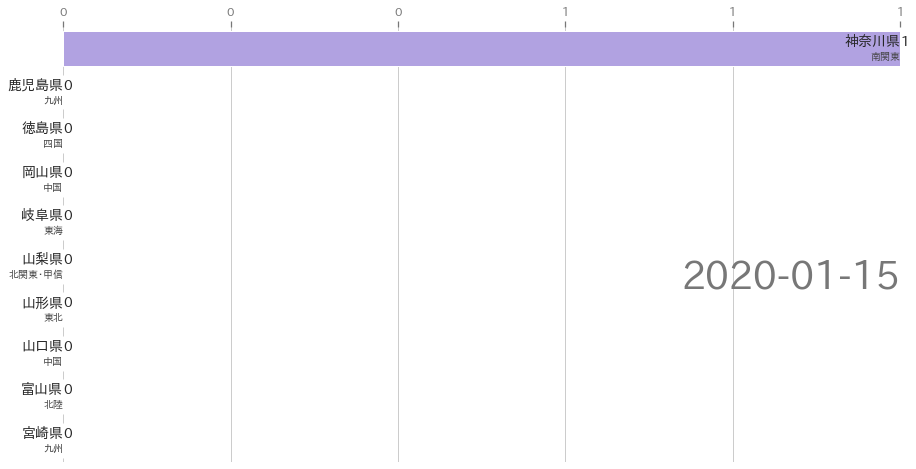

In [21]:
# make total patient bar chart race animation
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, interval = 250, repeat=False, frames=df_cumsum.index)

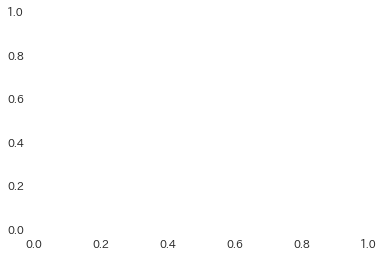

In [22]:
# visualize animation
from matplotlib import rc
rc('animation', html='jshtml')
animator

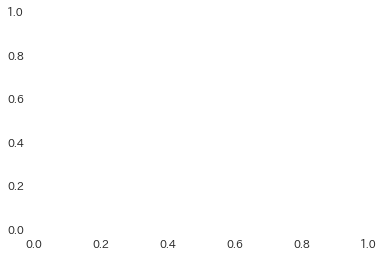

In [23]:
# save animation (to GIF Animation file)
from matplotlib.animation import PillowWriter
animator.save("bar_chart_race.gif", writer=PillowWriter(fps=4))

## Display saved gif file

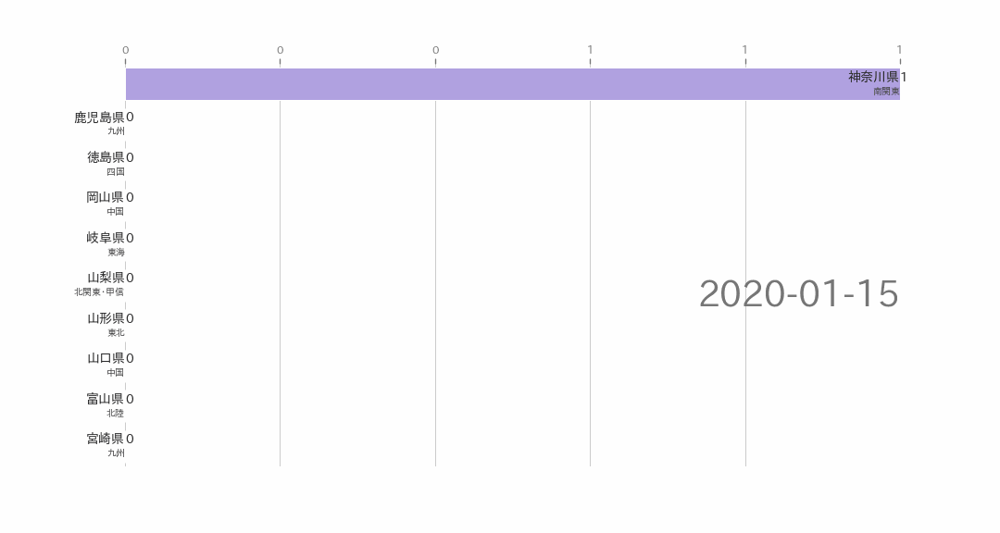

In [24]:
import IPython.display
with open('./bar_chart_race.gif','rb') as f:
    display(IPython.display.Image(data=f.read(), format='png'))

In [25]:
df_cumsum.index[-1]

Timestamp('2020-04-09 00:00:00', freq='D')

## Get last top10 prefecture

In [0]:
lastTop10_prefecture = df_cumsum[df_cumsum.index == df_cumsum.index[-1]].iloc[0].sort_values(ascending=False)[:10].index.values

In [27]:
df_cumsum.loc[:, lastTop10_prefecture].tail()

,東京都,大阪府,神奈川県,愛知県,兵庫県,福岡県,埼玉県,北海道,千葉県,京都府
公表日,,,,,,,,,,
2020-04-05,1032,408,263,228,203,162,186,193,152,78
2020-04-06,1115,428,269,239,209,176,196,193,160,78
2020-04-07,1195,481,287,249,229,199,196,193,165,78
2020-04-08,1195,481,287,249,229,199,196,193,165,78
2020-04-09,1195,481,287,249,229,199,196,193,165,78


## Draw line chart


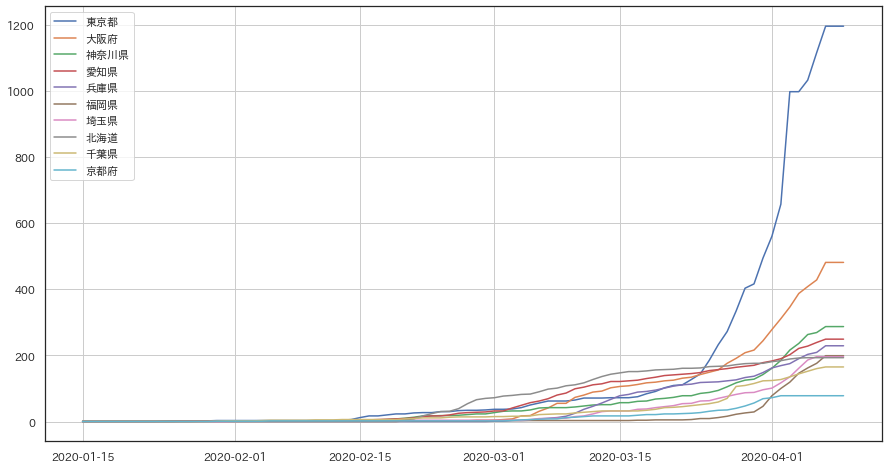

In [28]:
fig, ax = plt.subplots(figsize=(15, 8))
for col in lastTop10_prefecture:
    plt.plot(df_cumsum.index, df_cumsum.loc[:, col].values, label=col)
ax.grid(which='major', axis='y', linestyle='-')
ax.grid(which='major', axis='x', linestyle='-')
plt.legend(loc='best')

plt.show()

## Draw logarithmic chart


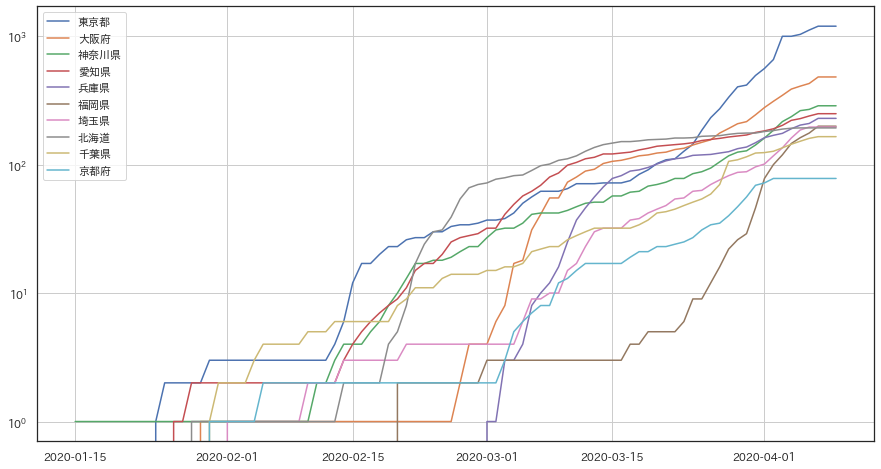

In [29]:
fig, ax = plt.subplots(figsize=(15, 8))
for col in lastTop10_prefecture:
    plt.plot(df_cumsum.index, df_cumsum.loc[:, col].values, label=col)
ax.set_yscale('log')  # axis y 'log' scale
ax.grid(which='major', axis='y', linestyle='-')
ax.grid(which='major', axis='x', linestyle='-')
plt.legend(loc='best')

plt.show()

## Visualize map

In [0]:
# read location master
df_mst_loc = pd.read_csv('location.csv')

In [31]:
# merge location master
df_loc = pd.merge(df_origin, df_mst_loc, left_on='居住市区町村', right_on='居住地', how='left')
df_loc.tail()

,ID,厚労省コード,都道府県症例番号,発症日,確定日,公表日,全国地方公共団体コード,受診都道府県,管理市区町村,居住都道府県,居住市区町村,年代,性別,職業,医療従事者ﾌﾗｸﾞ,ステータス,退院済ﾌﾗｸﾞ,基礎疾患ﾌﾗｸﾞ,症状・経過,症状一覧,行動歴,濃厚接触者状況,濃厚接触場所,海外渡航歴ﾌﾗｸﾞ,ﾀﾞｲﾔﾓﾝﾄﾞﾌﾟﾘﾝｾｽ号乗船ﾌﾗｸﾞ,情報源1,情報源2,備考,Unnamed: 28,Unnamed: 29,Unnamed: 30,Unnamed: 31,居住地,緯度（世界測地系）,経度（世界測地系）,情報源
5473,2057,空港検疫52,51-52,NaN,2020/03/30,NaN,NaN,関西国際空港,NaN,不明,NaN,30 - 39,男性,NaN,NaN,無症状,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_10638.html,3/29ドイツから帰国,NaN,NaN,51,52.0,NaN,NaN,NaN,NaN
5474,2058,空港検疫53,51-53,NaN,2020/03/30,NaN,NaN,関西国際空港,NaN,不明,NaN,40 - 49,男性,NaN,NaN,無症状,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_10638.html,3/29オランダから帰国,NaN,NaN,51,53.0,NaN,NaN,NaN,NaN
5475,974,空港検疫9,51-,NaN,2020/03/20,NaN,NaN,関西国際空港,NaN,福岡県,NaN,30 - 39,男性,NaN,NaN,無症状,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_10352.html,3/11イタリア(ピエモンテ州)から帰国/関西空港検疫所,NaN,NaN,51,NaN,NaN,NaN,NaN,NaN
5476,975,空港検疫10,51-,NaN,2020/03/20,NaN,NaN,関西国際空港,NaN,和歌山県,NaN,20 - 29,女性,NaN,NaN,無症状,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.mhlw.go.jp/stf/newpage_10352.html,4/18スイスから帰国/関西空港検疫所,NaN,NaN,51,NaN,NaN,NaN,NaN,NaN
5477,1818,(3月29日公表分),確認中,NaN,NaN,2020/3/29,NaN,東京都,NaN,NaN,NaN,30 - 39,女性,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0,0.0,https://www.bousai.metro.tokyo.lg.jp/_res/proj...,NaN,NaN,NaN,NaN,確認中,NaN,NaN,NaN,NaN,NaN


In [32]:
# create location data
df_loc = df_loc[['公表日', '緯度（世界測地系）', '経度（世界測地系）']].dropna()
df_loc['公表日'] = pd.to_datetime(df_loc['公表日'], format='%Y/%m/%d')
df_loc.head()

,公表日,緯度（世界測地系）,経度（世界測地系）
16,2020-02-14,43.062245,141.354673
17,2020-02-19,43.062245,141.354673
19,2020-02-20,43.062245,141.354673
23,2020-02-22,42.368085,141.081643
25,2020-02-22,43.770636,142.364819


### Plot Map

In [0]:
import folium
import folium.plugins

In [0]:
# set map center (nagoya city office) and scale size
map = folium.Map(location=[35.1814552, 136.9045057], zoom_start=6)

In [35]:
# add heatmap
folium.plugins.HeatMap(df_loc[['緯度（世界測地系）', '経度（世界測地系）']].values, radius=6, blur=3).add_to(map)

In [36]:
map.save('covid_19_heatmap.html')
map

### Show Preview Map (for Github)

### Install chromedriver and selenium

In [37]:
!apt-get update
!apt install chromium-chromedriver
!cp /usr/lib/chromium-browser/chromedriver /usr/bin
!pip install selenium

Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:5 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Hit:6 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:7 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:8 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:9 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran35/ InRelease
Hit:10 http://ppa.launchpad.net/marutter/c2d4u3.5/ubuntu bionic InRelease
Get:12 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Fetched 252 kB in 2s (133 kB/s)
Reading package lists... Done
Reading package lists... Done
Building de

### Create Preview image

In [0]:
# import and set webdriver option
from selenium import webdriver
options = webdriver.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')

In [0]:
# get web driver and get html file
wd = webdriver.Chrome('chromedriver',options=options)
wd.get('file:///content/covid_19_heatmap.html')

In [40]:
# save preview image
wd.save_screenshot("covid_19_heatmap.png")

True

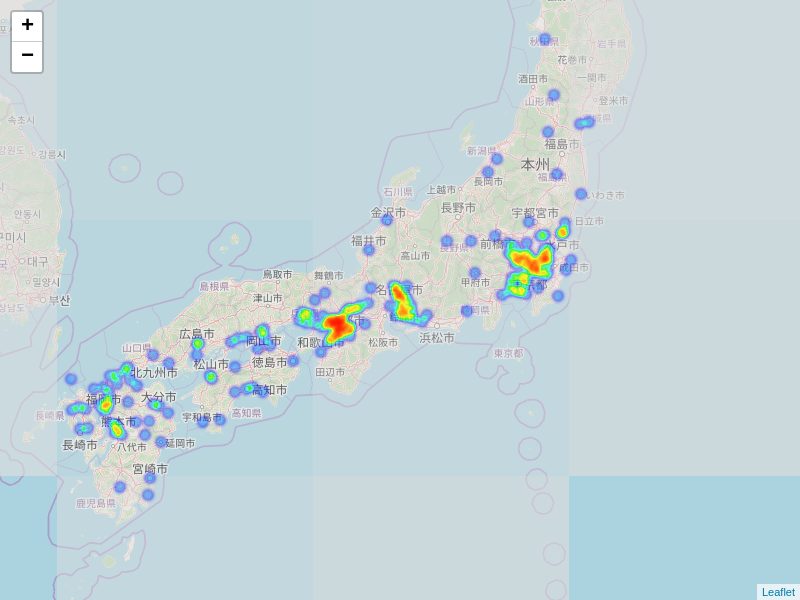

In [41]:
# show map preview image
display(IPython.display.Image(filename='covid_19_heatmap.png'))

## Future predict

In [0]:
# import Prophet
from fbprophet import Prophet

In [0]:
# summary all columns ( = Daily total patient in japan)
df_total = df_cumsum.sum(axis=1)

In [44]:
# create DataFrame for Prophet
df_prophet = pd.DataFrame()
df_prophet['ds'] = df_total.index.values
df_prophet['y'] = df_total.values
df_prophet['diff'] = df_prophet['y'].diff(1).fillna(0).astype(np.int64)
df_prophet.tail(10)

,ds,y,diff
76,2020-03-31,2066,218
77,2020-04-01,2305,239
78,2020-04-02,2571,266
79,2020-04-03,3122,551
80,2020-04-04,3341,219
81,2020-04-05,3524,183
82,2020-04-06,3714,190
83,2020-04-07,3950,236
84,2020-04-08,3968,18
85,2020-04-09,3983,15


In [45]:
# fit Prophet
model = Prophet(growth='linear', interval_width=0.90)
model.fit(df_prophet)

INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [0]:
# make future dataframe
future = model.make_future_dataframe(periods=60, freq='d')

In [0]:
# predict future
forecast = model.predict(future)

In [48]:
# check future data
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
141,2020-06-04,13394.527566,11261.456093,15418.776791
142,2020-06-05,13589.735187,11496.314812,15662.514484
143,2020-06-06,13766.095142,11577.270473,15908.685509
144,2020-06-07,13933.699753,11678.233166,16118.788804
145,2020-06-08,14084.038201,11745.306570,16362.903853


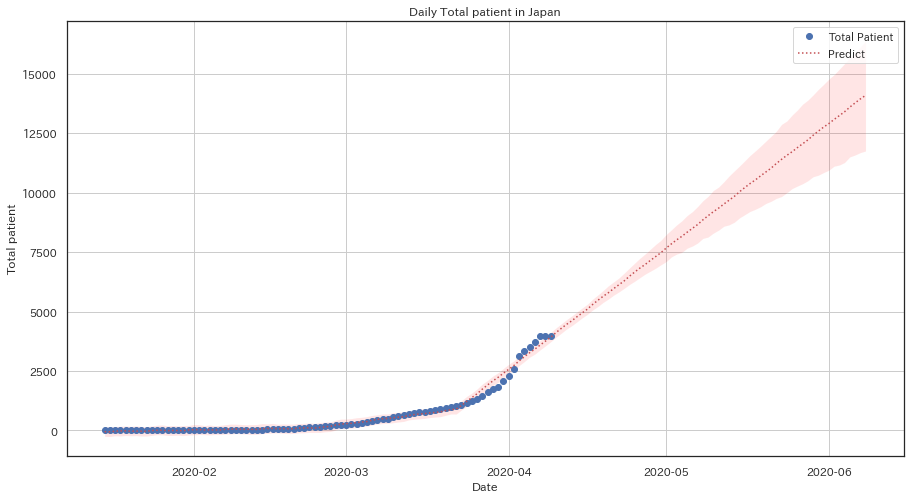

In [49]:
fig, ax = plt.subplots(figsize=(15, 8))
plt.plot(df_prophet.ds, df_prophet.y, 'bo', label='Total Patient')
plt.plot(forecast.ds, forecast.yhat, 'r:', label='Predict')
ax.fill_between(forecast.ds, forecast.yhat_lower, forecast.yhat_upper, facecolor='red', alpha=0.1)

# ax2 = ax.twinx()
# ax2.plot(df_prophet.ds, df_prophet['diff'], 'g--', label='Daily increase')

ax.grid(which='major', axis='y', linestyle='-')
ax.grid(which='major', axis='x', linestyle='-')
# ax.set_yscale('log')  # axis y 'log' scale
ax.set_xlabel("Date")
ax.set_ylabel("Total patient")
ax.set_title("Daily Total patient in Japan")

# handler1, label1 = ax.get_legend_handles_labels()
# handler2, label2 = ax2.get_legend_handles_labels()
# ax.legend(handler1 + handler2, label1 + label2, loc='best', borderaxespad=0.)

plt.legend(loc='best')
plt.show()

### Expected to converge in two months

In [50]:
# last yhat_upper
cap = forecast[-1:]['yhat_upper'].values[0]
cap

16362.903852953315

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


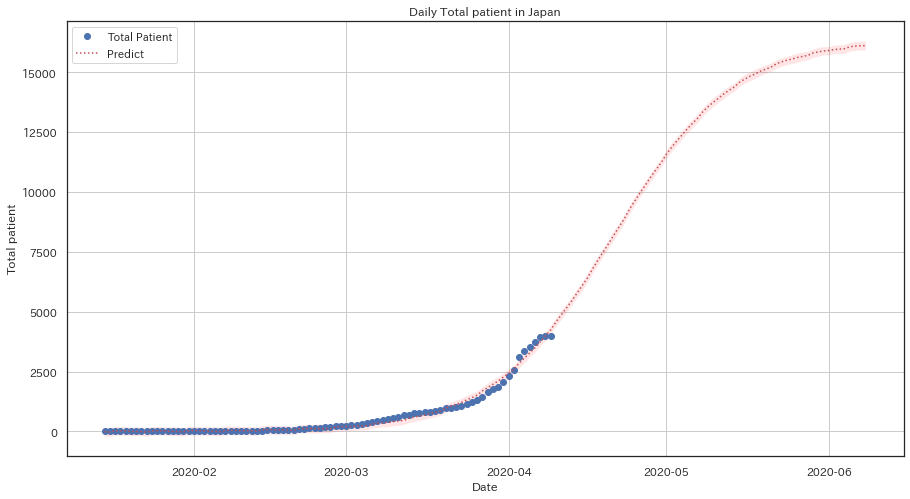

In [51]:
# fit Prophet
model = Prophet(growth='logistic', interval_width=0.90)
df_prophet['cap'] = cap
model.fit(df_prophet)

# make future dataframe
future = model.make_future_dataframe(periods=60, freq='d')
future['cap'] = cap

# predict future
forecast = model.predict(future)

# draw chart
fig, ax = plt.subplots(figsize=(15, 8))
plt.plot(df_prophet.ds, df_prophet.y, 'bo', label='Total Patient')
plt.plot(forecast.ds, forecast.yhat, 'r:', label='Predict')
ax.fill_between(forecast.ds, forecast.yhat_lower, forecast.yhat_upper, facecolor='red', alpha=0.1)

ax.grid(which='major', axis='y', linestyle='-')
ax.grid(which='major', axis='x', linestyle='-')
ax.set_xlabel("Date")
ax.set_ylabel("Total patient")
ax.set_title("Daily Total patient in Japan")
plt.legend(loc='best')
plt.show()